In [190]:
import pandas as pd
from prophet import Prophet
import datetime as dt
import numpy as np
from bs4 import BeautifulSoup
import markdown
import string
import re
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from wordcloud import WordCloud
from wordcloud import ImageColorGenerator
from wordcloud import STOPWORDS

pd.set_option('display.max_columns', None)

def remove_html_tags(text):
    return BeautifulSoup(text, "html.parser").get_text()

# Function to remove Markdown
def remove_markdown(text):
    html = markdown.markdown(text)
    return BeautifulSoup(html+ "html.parser").get_text()

def clean_row(row):
    return row.apply(lambda x: remove_markdown(remove_html_tags(x)) if isinstance(x, str) else x)

def clean_text(text):
    text = re.sub(r'-', ' ', text)
    text = re.sub(r'#', 'unique_column_heading', text)
    text = re.sub(r'None', 'unique_column_heading', text)
    text = re.sub(r'<strong>', '', text)
    text = re.sub(r'</strong>', ' ', text)
    text = re.sub(r'<em>', ' ', text)
    text = re.sub(r'</em>', ' ', text)
    # Remove punctuation
    text = text.translate(str.maketrans('', '', string.punctuation))
    # Convert to lowercase
    text = text.lower()
    # Replace spaces with dashes
    text = re.sub(r'\s+', '-', text)
    return text

def rename_duplicate_columns(mhs_df):
    cols = pd.Series(mhs_df.columns)
    for dup in cols[cols.duplicated()].unique():
        cols[cols[cols == dup].index.values.tolist()] = [dup + '_' + str(i) if i != 0 else dup for i in range(sum(cols == dup))]
    mhs_df.columns = cols
    return mhs_df

def preprocess_df(df):
    df = df.astype(str)
    df = rename_duplicate_columns(df)
    df = df.reset_index(drop=True)
    return df

def merge_columns(df: pd.DataFrame) -> pd.DataFrame:
    merged_columns = {}

    for col in df.columns:
        if col in merged_columns:
            merged_columns[col] = merged_columns[col].fillna('') + ' ' + df[col].fillna('')
        else:
            merged_columns[col] = df[col].fillna('')

    merged_df = pd.DataFrame(merged_columns)

    return merged_df

def reset_index_with_string(df, string):
    df = df.reset_index(drop=True)
    df.index = [f"{string}{i}" for i in df.index.astype(str)]
    return df

def fix_dates_in_col(mhs_df, column_name):
    mhs_df[column_name] = pd.to_datetime(mhs_df[column_name], format="mixed")
    mhs_df[column_name] = mhs_df[column_name].dt.strftime('%m/%d/%Y')
    return mhs_df

def no_data_columns(df):
    empty_or_nan_columns = []
    
    for column in df.columns:
        # Check if the column is empty
        if df[column].empty:
            empty_or_nan_columns.append(column)
        # Check if all values are NaN or the string 'nan'
        elif df[column].apply(lambda x: pd.isna(x) or x == 'nan').all():
            empty_or_nan_columns.append(column)
    
    return empty_or_nan_columns

In [191]:
column_mapping = {
    'are-you-self-employed' : 'self-employed', 
    'how-many-employees-does-your-company-or-organization-have' : 'num-employees', 
    'is-your-employer-primarily-a-tech-companyorganization' : 'tech-employer', 
    'is-your-primary-role-within-your-company-related-to-techit' : 'tech-role', 
    'does-your-employer-provide-mental-health-benefits-as-part-of-healthcare-coverage' : 'has-mental-health-benefits', 
    'do-you-know-the-options-for-mental-health-care-available-under-your-employer-provided-health-coverage' : 'know-mental-health-options', 
    'has-your-employer-ever-formally-discussed-mental-health-for-example-as-part-of-a-wellness-campaign-or-other-official-communication' : 'discussed-mental-health', 
    'does-your-employer-offer-resources-to-learn-more-about-mental-health-disorders-and-options-for-seeking-help' : 'has-mental-health-resources', 
    'is-your-anonymity-protected-if-you-choose-to-take-advantage-of-mental-health-or-substance-abuse-treatment-resources-provided-by-your-employer' : 'anonymity-protected', 
    'if-a-mental-health-issue-prompted-you-to-request-a-medical-leave-from-work-how-easy-or-difficult-would-it-be-to-ask-for-that-leave' : 'mental-health-leave-ease', 
    'would-you-feel-more-comfortable-talking-to-your-coworkers-about-your-physical-health-or-your-mental-health' : 'comfort-discussing-health', 
    'would-you-feel-comfortable-discussing-a-mental-health-issue-with-your-direct-supervisors' : 'discuss-mental-health-supervisor', 
    'have-you-ever-discussed-your-mental-health-with-your-employer' : 'discussed-mental-health-employer', 
    'describe-the-conversation-you-had-with-your-employer-about-your-mental-health-including-their-reactions-and-what-actions-were-taken-to-address-your-mental-health-issuequestions' : 'mental-health-talk-employer', 
    'would-you-feel-comfortable-discussing-a-mental-health-issue-with-your-coworkers' : 'discuss-mental-health-coworkers', 
    'have-you-ever-discussed-your-mental-health-with-coworkers' : 'discussed-mental-health-coworkers', 
    'describe-the-conversation-with-coworkers-you-had-about-your-mental-health-including-their-reactions' : 'mental-health-talk-coworkers', 
    'have-you-ever-had-a-coworker-discuss-their-or-another-coworkers-mental-health-with-you' : 'coworker-mental-health-discussion', 
    'describe-the-conversation-your-coworker-had-with-you-about-their-mental-health-please-do-not-use-names' : 'coworker-mental-health-talk', 
    'overall-how-much-importance-does-your-employer-place-on-physical-health' : 'importance-physical-health', 
    'overall-how-much-importance-does-your-employer-place-on-mental-health' : 'importance-mental-health', 
    'do-you-have-medical-coverage-private-insurance-or-state-provided-that-includes-treatment-of-mental-health-disorders' : 'mental-health-coverage', 
    'do-you-know-local-or-online-resources-to-seek-help-for-a-mental-health-issue' : 'know-mental-health-resources', 
    'if-you-have-been-diagnosed-or-treated-for-a-mental-health-disorder-do-you-ever-reveal-this-to-clients-or-business-contacts' : 'reveal-mental-health-clients', 
    'if-you-have-revealed-a-mental-health-disorder-to-a-client-or-business-contact-how-has-this-affected-you-or-the-relationship' : 'effect-reveal-mental-health', 
    'if-you-have-been-diagnosed-or-treated-for-a-mental-health-disorder-do-you-ever-reveal-this-to-coworkers-or-employees' : 'reveal-mental-health-coworkers', 
    'if-you-have-revealed-a-mental-health-disorder-to-a-coworker-or-employee-how-has-this-impacted-you-or-the-relationship' : 'impact-reveal-mental-health', 
    'do-you-believe-your-productivity-is-ever-affected-by-a-mental-health-issue' : 'productivity-mental-health', 
    'if-yes-what-percentage-of-your-work-time-time-performing-primary-or-secondary-job-functions-is-affected-by-a-mental-health-issue' : 'percentage-affected-mental-health', 
    'do-you-have-previous-employers' : 'previous-employers', 
    'was-your-employer-primarily-a-tech-companyorganization' : 'previous-tech-employer', 
    'have-your-previous-employers-provided-mental-health-benefits' : 'previous-mental-health-benefits', 
    'were-you-aware-of-the-options-for-mental-health-care-provided-by-your-previous-employers' : 'aware-previous-mental-health-options', 
    'did-your-previous-employers-ever-formally-discuss-mental-health-as-part-of-a-wellness-campaign-or-other-official-communication' : 'discussed-mental-health-previous', 
    'did-your-previous-employers-provide-resources-to-learn-more-about-mental-health-disorders-and-how-to-seek-help' : 'previous-mental-health-resources', 
    'was-your-anonymity-protected-if-you-chose-to-take-advantage-of-mental-health-or-substance-abuse-treatment-resources-with-previous-employers' : 'previous-anonymity-protected', 
    'would-you-have-felt-more-comfortable-talking-to-your-previous-employer-about-your-physical-health-or-your-mental-health' : 'previous-comfort-discussing-health', 
    'would-you-have-been-willing-to-discuss-your-mental-health-with-your-direct-supervisors' : 'previous-discuss-mental-health-supervisor', 
    'did-you-ever-discuss-your-mental-health-with-your-previous-employer' : 'previous-discussed-mental-health', 
    'describe-the-conversation-you-had-with-your-previous-employer-about-your-mental-health-including-their-reactions-and-actions-taken-to-address-your-mental-health-issuequestions' : 'previous-mental-health-talk-employer', 
    'would-you-have-been-willing-to-discuss-your-mental-health-with-your-coworkers-at-previous-employers' : 'previous-discuss-mental-health-coworkers', 
    'did-you-ever-discuss-your-mental-health-with-a-previous-coworkers' : 'previous-discussed-mental-health-coworkers', 
    'describe-the-conversation-you-had-with-your-previous-coworkers-about-your-mental-health-including-their-reactions' : 'previous-mental-health-talk-coworkers', 
    'did-you-ever-have-a-previous-coworker-discuss-their-or-another-coworkers-mental-health-with-you' : 'previous-coworker-mental-health-discussion', 
    'describe-the-conversation-your-coworker-had-with-you-about-their-mental-health-please-do-not-use-names1' : 'previous-coworker-mental-health-talk', 
    'overall-how-much-importance-did-your-previous-employer-place-on-physical-health' : 'previous-importance-physical-health', 
    'overall-how-much-importance-did-your-previous-employer-place-on-mental-health' : 'previous-importance-mental-health', 
    'do-you-currently-have-a-mental-health-disorder' : 'current-mental-health-disorder', 
    'have-you-ever-been-diagnosed-with-a-mental-health-disorder' : 'diagnosed-mental-health', 
    'anxiety-disorder-generalized-social-phobia-etc' : 'anxiety-disorder', 
    'mood-disorder-depression-bipolar-disorder-etc' : 'mood-disorder', 
    'psychotic-disorder-schizophrenia-schizoaffective-etc' : 'psychotic-disorder', 
    'eating-disorder-anorexia-bulimia-etc' : 'eating-disorder', 
    'attention-deficit-hyperactivity-disorder' : 'adhd', 
    'personality-disorder-borderline-antisocial-paranoid-etc' : 'personality-disorder', 
    'obsessive-compulsive-disorder' : 'ocd', 
    'post-traumatic-stress-disorder' : 'ptsd', 
    'stress-response-syndromes' : 'stress-response', 
    'dissociative-disorder' : 'dissociative-disorder', 
    'substance-use-disorder' : 'substance-use', 
    'addictive-disorder' : 'addictive-disorder', 
    'other' : 'other', 
    'anxiety-disorder-generalized-social-phobia-etc1' : 'anxiety-disorder1', 
    'mood-disorder-depression-bipolar-disorder-etc1' : 'mood-disorder1', 
    'psychotic-disorder-schizophrenia-schizoaffective-etc1' : 'psychotic-disorder1', 
    'eating-disorder-anorexia-bulimia-etc1' : 'eating-disorder1', 
    'attention-deficit-hyperactivity-disorder1' : 'adhd1', 
    'personality-disorder-borderline-antisocial-paranoid-etc1' : 'personality-disorder1', 
    'obsessive-compulsive-disorder1' : 'ocd1', 
    'post-traumatic-stress-disorder' : 'ptsd1', 
    'stress-response-syndromes1' : 'stress-response1', 
    'dissociative-disorder1' : 'dissociative-disorder1', 
    'substance-use-disorder1' : 'substance-use1', 
    'addictive-disorder1' : 'addictive-disorder1', 
    'other1' : 'other1', 
    'anxiety-disorder-generalized-social-phobia-etc2' : 'anxiety-disorder2', 
    'mood-disorder-depression-bipolar-disorder-etc2' : 'mood-disorder2', 
    'psychotic-disorder-schizophrenia-schizoaffective-etc2' : 'psychotic-disorder2', 
    'eating-disorder-anorexia-bulimia-etc2' : 'eating-disorder2', 
    'attention-deficit-hyperactivity-disorder2' : 'adhd2', 
    'personality-disorder-borderline-antisocial-paranoid-etc2' : 'personality-disorder2', 
    'obsessive-compulsive-disorder2' : 'ocd2', 
    'post-traumatic-stress-disorder1' : 'ptsd2', 
    'stress-response-syndromes2' : 'stress-response2', 
    'dissociative-disorder2' : 'dissociative-disorder2', 
    'substance-use-disorder2' : 'substance-use2', 
    'addictive-disorder2' : 'addictive-disorder2', 
    'other2' : 'other2', 
    'have-you-had-a-mental-health-disorder-in-the-past' : 'past-mental-health-disorder', 
    'have-you-ever-sought-treatment-for-a-mental-health-disorder-from-a-mental-health-professional' : 'sought-treatment', 
    'do-you-have-a-family-history-of-mental-illness' : 'family-history-mental-illness', 
    'if-you-have-a-mental-health-disorder-how-often-do-you-feel-that-it-interferes-with-your-work-when-being-treated-effectively' : 'mental-health-interference-treated', 
    'if-you-have-a-mental-health-disorder-how-often-do-you-feel-that-it-interferes-with-your-work-when-not-being-treated-effectively-ie-when-you-are-experiencing-symptoms' : 'mental-health-interference-untreated', 
    'have-your-observations-of-how-another-individual-who-discussed-a-mental-health-issue-made-you-less-likely-to-reveal-a-mental-health-issue-yourself-in-your-current-workplace' : 'observations-mental-health-discussion', 
    'how-willing-would-you-be-to-share-with-friends-and-family-that-you-have-a-mental-illness' : 'share-mental-illness', 
    'would-you-be-willing-to-bring-up-a-physical-health-issue-with-a-potential-employer-in-an-interview' : 'physical-health-interview', 
    'why-or-why-not' : 'physical-health-reason', 
    'would-you-bring-up-your-mental-health-with-a-potential-employer-in-an-interview' : 'mental-health-interview', 
    'why-or-why-not1' : 'mental-health-reason', 
    'are-you-openly-identified-at-work-as-a-person-with-a-mental-health-issue' : 'open-mental-health', 
    'has-being-identified-as-a-person-with-a-mental-health-issue-affected-your-career' : 'mental-health-career', 
    'how-has-it-affected-your-career' : 'mental-health-career-effect', 
    'if-they-knew-you-suffered-from-a-mental-health-disorder-how-do-you-think-that-your-team-membersco-workers-would-react' : 'team-reaction', 
    'have-you-observed-or-experienced-an-unsupportive-or-badly-handled-response-to-a-mental-health-issue-in-your-current-or-previous-workplace' : 'unsupportive-response', 
    'describe-the-circumstances-of-the-badly-handled-or-unsupportive-response' : 'unsupportive-response-details', 
    'have-you-observed-or-experienced-a-supportive-or-well-handled-response-to-a-mental-health-issue-in-your-current-or-previous-workplace' : 'supportive-response', 
    'describe-the-circumstances-of-the-supportive-or-well-handled-response' : 'supportive-response-details', 
    'overall-how-well-do-you-think-the-tech-industry-supports-employees-with-mental-health-issues' : 'industry-support', 
    'briefly-describe-what-you-think-the-industry-as-a-whole-andor-employers-could-do-to-improve-mental-health-support-for-employees' : 'improve-industry-support', 
    'if-there-is-anything-else-you-would-like-to-tell-us-that-has-not-been-covered-by-the-survey-questions-please-use-this-space-to-do-so' : 'additional-comments', 
    'would-you-be-willing-to-talk-to-one-of-us-more-extensively-about-your-experiences-with-mental-health-issues-in-the-tech-industry-note-that-all-interview-responses-would-be-used-anonymously-and-only-with-your-permission' : 'interview-mental-health', 
    'what-is-your-age' : 'age', 
    'what-is-your-gender' : 'gender', 
    'what-country-do-you-live-in' : 'country-live', 
    'what-us-state-or-territory-do-you-live-in' : 'us-state-live', 
    'what-is-your-race' : 'race', 
    'other3' : 'other3', 
    'what-country-do-you-work-in' : 'country-work', 
    'what-us-state-or-territory-do-you-work-in' : 'us-state-work', 
    'have-you-been-diagnosed-with-covid-19' : 'covid-19-diagnosis', 
    'response-type' : 'response-type', 
    'start-date-utc' : 'start-date', 
    'submit-date-utc' : 'submit-date', 
    'network-id' : 'network-id', 
    'tags' : 'tags'
}

cols_kept=['year','country-live','race','gender','age',
           'anxiety-disorder','anxiety-disorder1','anxiety-disorder2',
           'mood-disorder','mood-disorder1','mood-disorder2',
           'psychotic-disorder','psychotic-disorder1','psychotic-disorder2',
           'eating-disorder','eating-disorder1','eating-disorder2',
           'adhd','adhd1','adhd2',
           'personality-disorder','personality-disorder1','personality-disorder2',
           'ocd','ocd1','ocd2',
           'ptsd1','ptsd2',
           'stress-response','stress-response1','stress-response2',
           'dissociative-disorder','dissociative-disorder1','dissociative-disorder2',
           'substance-use','substance-use1','substance-use2',
           'addictive-disorder','addictive-disorder1','addictive-disorder2',
           'other','other1','other2']

# For 2020
mhs_2020 = pd.read_csv("resources/2020.csv", index_col=False)
mhs_2020["year"] = 2020
mhs_2020.columns = [clean_text(col) for col in mhs_2020.columns]
# mhs_2020 = mhs_2020.apply(clean_row, axis=1)
mhs_2020 = preprocess_df(mhs_2020)
mhs_2020.rename(columns=column_mapping, inplace=True)
mhs_2020_fin=mhs_2020 #[cols_kept]
display(mhs_2020_fin.info())
column_names_2020 = mhs_2020_fin.columns.tolist()
print(len(column_names_2020))

# For 2021
mhs_2021 = pd.read_csv("resources/2021.csv", index_col=False)
mhs_2021["year"] = 2021
mhs_2021.columns = [clean_text(col) for col in mhs_2021.columns]
# mhs_2021 = mhs_2021.apply(clean_row, axis=1)
mhs_2021 = preprocess_df(mhs_2021)
mhs_2021.rename(columns=column_mapping, inplace=True)
mhs_2021_fin=mhs_2021 #[cols_kept]
display(mhs_2021_fin.info())
column_names_2021 = mhs_2021_fin.columns.tolist()
print(len(column_names_2021))

# For 2022
mhs_2022 = pd.read_csv("resources/2022.csv", index_col=False)
mhs_2022["year"] = 2022
mhs_2022.columns = [clean_text(col) for col in mhs_2022.columns]
# mhs_2022 = mhs_2022.apply(clean_row, axis=1)
mhs_2022 = preprocess_df(mhs_2022)
mhs_2022.rename(columns=column_mapping, inplace=True)
mhs_2022_fin=mhs_2022 #[cols_kept]
display(mhs_2022_fin.info())
column_names_2022 = mhs_2022_fin.columns.tolist()
print(len(column_names_2022))

# For 2023
mhs_2023 = pd.read_csv("resources/2023.csv", index_col=False)
mhs_2023["year"] = 2023
mhs_2023.columns = [clean_text(col) for col in mhs_2023.columns]
# mhs_2023 = mhs_2023.apply(clean_row, axis=1)
mhs_2023 = preprocess_df(mhs_2023)
mhs_2023.rename(columns=column_mapping, inplace=True)
mhs_2023_fin=mhs_2023 #[cols_kept]
display(mhs_2023_fin.info())
column_names_2023 = mhs_2023_fin.columns.tolist()
print(len(column_names_2023))


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Columns: 121 entries, uniquecolumnheading to year
dtypes: object(121)
memory usage: 170.3+ KB


None

121
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131 entries, 0 to 130
Columns: 125 entries, uniquecolumnheading to year
dtypes: object(125)
memory usage: 128.1+ KB


None

125
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 164 entries, 0 to 163
Columns: 125 entries, uniquecolumnheading to year
dtypes: object(125)
memory usage: 160.3+ KB


None

125
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6 entries, 0 to 5
Columns: 125 entries, uniquecolumnheading to year
dtypes: object(125)
memory usage: 6.0+ KB


None

125


In [192]:
mhs_2020_fin = reset_index_with_string(mhs_2020_fin, "2020_")
mhs_2021_fin = reset_index_with_string(mhs_2021_fin, "2021_")
mhs_2022_fin = reset_index_with_string(mhs_2022_fin, "2022_")
mhs_2023_fin = reset_index_with_string(mhs_2023_fin, "2023_")

In [193]:
merged_mhs = pd.concat([mhs_2020_fin, mhs_2021_fin, mhs_2022_fin, mhs_2023_fin], axis=0)
merged_mhs.to_csv("resources/merged_mhs_dc.csv", index=False)

In [194]:
merged_mhs.convert_dtypes()
merged_mhs.dtypes

# merged_mhs.plot(kind='bar', x='year', y='age')
# plt.show()

uniquecolumnheading                           object
self-employed                                 object
num-employees                                 object
tech-employer                                 object
tech-role                                     object
has-mental-health-benefits                    object
know-mental-health-options                    object
discussed-mental-health                       object
has-mental-health-resources                   object
anonymity-protected                           object
mental-health-leave-ease                      object
comfort-discussing-health                     object
discuss-mental-health-supervisor              object
discussed-mental-health-employer              object
mental-health-talk-employer                   object
discuss-mental-health-coworkers               object
discussed-mental-health-coworkers             object
mental-health-talk-coworkers                  object
coworker-mental-health-discussion             

In [195]:
# merged_mhs=merged_mhs.reset_index()

cols_to_concat=["anxiety-disorder",'anxiety-disorder1','anxiety-disorder2',
           'mood-disorder','mood-disorder1','mood-disorder2',
           'psychotic-disorder','psychotic-disorder1','psychotic-disorder2',
           'eating-disorder','eating-disorder1','eating-disorder2',
           'adhd','adhd1','adhd2',
           'personality-disorder','personality-disorder1','personality-disorder2',
           'ocd','ocd1','ocd2',
           'ptsd1','ptsd2', 'post-traumatic-stress-disorder_1',
           'stress-response','stress-response1','stress-response2',
           'dissociative-disorder','dissociative-disorder1','dissociative-disorder2',
           'substance-use','substance-use1','substance-use2',
           'addictive-disorder','addictive-disorder1','addictive-disorder2',
           'other','other1','other2']

concatenated_series = merged_mhs[cols_to_concat].apply(lambda row: '| '.join(str(val) for val in row), axis=1)

merged_mhs['disorders'] = concatenated_series
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("nan|", '')
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("nan", '')
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace(", ", '||')
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace(" ", '')
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("||", ', ')
merged_mhs.drop(columns=cols_to_concat, inplace=True)
qualitative_cols = ["uniquecolumnheading", "additional-comments","improve-industry-support","supportive-response-details","unsupportive-response-details","mental-health-reason","physical-health-reason", "start-date", "country-work", "us-state-work", 'other3', 'mental-health-talk-employer',
'mental-health-talk-coworkers',
'coworker-mental-health-talk', 
'previous-discussed-mental-health', 
'previous-mental-health-talk-employer',  
'previous-discuss-mental-health-coworkers', 
'previous-discussed-mental-health-coworkers', 
'previous-coworker-mental-health-discussion', 
'previous-coworker-mental-health-talk', 
'previous-importance-physical-health', 
'previous-importance-mental-health', 
'previous-employers',
'previous-tech-employer',
'previous-mental-health-benefits',
'aware-previous-mental-health-options',
'discussed-mental-health-previous',
'previous-mental-health-resources',
'previous-anonymity-protected',
'previous-comfort-discussing-health',
'previous-discuss-mental-health-supervisor']
merged_mhs.drop(columns=qualitative_cols, inplace=True)

/var/folders/lp/71p77wmn3x7dxlg4mnwx61cw0000gq/T/ipykernel_96999/4271453679.py:19: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`



In [196]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [198]:
merged_mhs['current-mental-health-disorder'] = merged_mhs['current-mental-health-disorder'].replace({
    "Don't Know": "False",
    "Yes": "True",
    "No": "False",
    "Possibly": "True"
})

merged_mhs['diagnosed-mental-health'] = merged_mhs['diagnosed-mental-health'].replace({
    "nan": "False",
    "Yes": "True",
    "No": "False"
})

merged_mhs['past-mental-health-disorder'] = merged_mhs['past-mental-health-disorder'].replace({
    "Don't Know": "False",
    "Yes": "True",
    "nan": "False",
    "No": "False",
    "Possibly": "True"
})

merged_mhs['sought-treatment'] = merged_mhs['sought-treatment'].replace({
    "nan": "False",
    "1": "False",
    "0": "True"
})

merged_mhs['family-history-mental-illness'] = merged_mhs['family-history-mental-illness'].replace({
    "I don't know": "False",
    "Yes": "True",
    "No": "False"
})

merged_mhs['mental-health-interference-treated'] = merged_mhs['mental-health-interference-treated'].replace({
    "Sometimes": "True",
    "Never": "False",
    "Often": "True",
    "Rarely": "False"
})

merged_mhs['mental-health-interference-untreated'] = merged_mhs['mental-health-interference-untreated'].replace({
    "Sometimes": "True",
    "Never": "False",
    "Often": "True",
    "Rarely": "False",
    "Not applicable to me": "False"
})

merged_mhs['observations-mental-health-discussion'] = merged_mhs['observations-mental-health-discussion'].replace({
    "Maybe": "True",
    "Yes": "True",
    "No": "False",
    "nan": "False"
})

merged_mhs['physical-health-interview'] = merged_mhs['physical-health-interview'].replace({
    "Maybe": "True",
    "Yes": "True",
    "No": "False"
})

merged_mhs['mental-health-interview'] = merged_mhs['mental-health-interview'].replace({
    "Maybe": "True",
    "Yes": "True",
    "No": "False"
})

merged_mhs['open-mental-health'] = merged_mhs['open-mental-health'].replace({
    "nan": "False",
    "1.0": "True",
    "0.0": "False"
})

merged_mhs['mental-health-career'] = merged_mhs['mental-health-career'].replace({
    "nan": "False",
    "1.0": "True",
    "0.0": "False"
})

merged_mhs['mental-health-career-effect'] = merged_mhs['mental-health-career-effect'].replace({
    "nan": "0",
    "10.0": "10",
    "1.0": "1",
    "0.0": "0",
    "6.0": "6",
    "2.0": "2",
    "5.0": "5",
    "4.0": "4",
    "7.0": "7",
    "3.0": "3",
    "9.0": "9",
    "8.0": "8"
})

merged_mhs['interview-mental-health'] = merged_mhs['interview-mental-health'].replace({
    "0": "False",
    "1": "True",
    "nan": "False"
})
merged_mhs['know-mental-health-resources'] = merged_mhs['know-mental-health-resources'].replace({
    "nan": "False",
    "No, I don't know any": "False",
    "Yes, I know several": "True",
    "I know some": "True"
})

merged_mhs['reveal-mental-health-clients'] = merged_mhs['reveal-mental-health-clients'].replace({
    "nan": "False",
    "No, because it doesn't matter": "False",
    "Yes, always": "True",
    "No, because it would impact me negatively": "False",
    "Not applicable to me": "False",
    "Sometimes, if it comes up": "True"
})

merged_mhs['effect-reveal-mental-health'] = merged_mhs['effect-reveal-mental-health'].replace({
    "nan": "Somewhat positive",
    "Positively": "Positive",
    "Negatively": "Negative",
    "I'm not sure": "Somewhat negative",
    "No change": "Neither"
})

merged_mhs['reveal-mental-health-coworkers'] = merged_mhs['reveal-mental-health-coworkers'].replace({
    "nan": "False",
    "No, because it doesn't matter": "False",
    "Yes, always": "True",
    "No, because it would impact me negatively": "False",
    "Not applicable to me": "False",
    "Sometimes, if it comes up": "True"
})

merged_mhs['impact-reveal-mental-health'] = merged_mhs['impact-reveal-mental-health'].replace({
    "nan": "Somewhat positive",
    "Positively": "Positive",
    "Negatively": "Negative",
    "I'm not sure": "Somewhat negative",
    "No change": "Neither"
})

merged_mhs['productivity-mental-health'] = merged_mhs['productivity-mental-health'].replace({
    "Yes": "True",
    "Unsure": "True",
    "Not applicable to me": "False",
    "nan": "False",
    "No": "False"
})


merged_mhs['percentage-affected-mental-health'] = merged_mhs['percentage-affected-mental-health'].replace({
    "1-25%" : "25",
    "76-100%" : "100",
    "26-50%" : "50",
    "51-75%" : "75",
    "nan" : "0"
})

merged_mhs['num-employees'] = merged_mhs['num-employees'].replace({
    "": '1',
    "nan": '1',
    "1-5": '1',
    "5-Jan": '1',
    "6-25": '5',
    "25-Jun": '5',
    "26-100": '25',
    "101-500": '100',
    "100-500": '100',
    "501-1000": '500',
    "500-1000": '500',
    "More than 1000": '1000'
})
merged_mhs['tech-employer'] = merged_mhs['tech-employer'].replace({
    "nan": "True",
    "0.0": "False",
    "1.0": "True",
})
merged_mhs['tech-role'] = merged_mhs['tech-role'].replace({
    "nan": "True",
    "0.0": "False",
    "1.0": "True",
})
merged_mhs['has-mental-health-benefits'] = merged_mhs['has-mental-health-benefits'].replace({
    "nan": "False",
    "No": "False",
    "Yes": "True",
    "I don't know": "False",
    "Not eligible for coverage / NA": "False"
})

merged_mhs['know-mental-health-options'] = merged_mhs['know-mental-health-options'].replace({
    "nan": "False",
    "No": "False",
    "Yes": "True",
    "I don't know": "False"
})

merged_mhs['discussed-mental-health'] = merged_mhs['discussed-mental-health'].replace({
    "nan": "False",
    "No": "False",
    "Yes": "True",
    "I don't know": "False"
})
merged_mhs['has-mental-health-resources'] = merged_mhs['has-mental-health-resources'].replace({
    "nan": "False",
    "No": "False",
    "Yes": "True",
    "I don't know": "False"
})
merged_mhs['anonymity-protected'] = merged_mhs['anonymity-protected'].replace({
    "nan": "False",
    "No": "False",
    "Yes": "True",
    "I don't know": "False"
})

merged_mhs['self-employed'] = merged_mhs['self-employed'].replace({
    "nan": "False",
    "0": "False",
    "1": "True",
})

merged_mhs['mental-health-coverage'] = merged_mhs['mental-health-coverage'].replace({
    "nan": "False",
    "0.0": "False",
    "1.0": "True",
})

merged_mhs['mental-health-leave-ease'] = merged_mhs['mental-health-leave-ease'].replace({
    "nan": "0",
    "Very easy": "1",
    "Somewhat easy": "2",
    "Neither easy nor difficult": "3",
    "Somewhat difficult": "4",
    "Difficult": "5",
    "I don't know": "0"
})

merged_mhs['comfort-discussing-health'] = merged_mhs['comfort-discussing-health'].replace({
    "nan": "0",
    "Physical health": "1",
    "Mental health": "2",
    "Same level of comfort for each": "3"
})

merged_mhs['discuss-mental-health-supervisor'] = merged_mhs['discuss-mental-health-supervisor'].replace({
    "nan": "False",
    "Yes": "True",
    "Maybe": "False",
    "No": "False"
})

merged_mhs['discussed-mental-health-employer'] = merged_mhs['discussed-mental-health-employer'].replace({
    "nan": "False",
    "Yes": "True",
    "Maybe": "False",
    "No": "False"
})

merged_mhs['discuss-mental-health-coworkers'] = merged_mhs['discuss-mental-health-coworkers'].replace({
    "nan": "False",
    "Yes": "True",
    "Maybe": "False",
    "No": "False"
})

merged_mhs['discussed-mental-health-coworkers'] = merged_mhs['discussed-mental-health-coworkers'].replace({
    "nan": "False",
    "Yes": "True",
    "Maybe": "False",
    "No": "False"
})
merged_mhs['coworker-mental-health-discussion'] = merged_mhs['coworker-mental-health-discussion'].replace({
    "nan": "False",
    "Yes": "True",
    "Maybe": "False",
    "No": "False"
})
merged_mhs['unsupportive-response'] = merged_mhs['unsupportive-response'].replace({
    'Maybe/Not sure': "False",
    'Yes, I observed': "True",
    'Yes, I experienced': "True",
    'No': "False",
    "I've always been self-employed": "False"
})

merged_mhs['supportive-response'] = merged_mhs['supportive-response'].replace({
    'Maybe/Not sure': "False",
    'Yes, I observed': "True",
    'Yes, I experienced': "True",
    'No': "False",
    "I've always been self-employed": "False"
})

merged_mhs['importance-physical-health'] = merged_mhs['importance-physical-health'].replace({
    "nan": "5",
    "1.0": "1",
    "2.0": "2",
    "3.0": "3",
    "4.0": "4",
    "5.0": "5",
    "6.0": "6",
    "7.0": "7",
    "8.0": "8",
    "9.0": "9",
    "10.0": "10"
})

merged_mhs['importance-mental-health'] = merged_mhs['importance-mental-health'].replace({
    "nan": "5",
    "1.0": "1",
    "2.0": "2",
    "3.0": "3",
    "4.0": "4",
    "5.0": "5",
    "6.0": "6",
    "7.0": "7",
    "8.0": "8",
    "9.0": "9",
    "10.0": "10"
})

merged_mhs = fix_dates_in_col(merged_mhs, 'submit-date')

merged_mhs['race'] = merged_mhs['race'].str.replace("More than one of the above", 'Multi')
merged_mhs['race'] = merged_mhs['race'].str.replace("nan", 'Unknown')
merged_mhs['race'] = merged_mhs['race'].str.replace("I prefer not to answer", 'Unknown')

merged_mhs['gender'] = merged_mhs['gender'].str.replace("afab non-binary", 'Non-Binary')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("non-binary", 'Non-Binary')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Non-binary/Agender", 'Non-Binary')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Non-binary", 'Non-Binary')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("female", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Female (cis)", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("FEMALE", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Female, cis-gendered", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Woman", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("woman", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("female, she/her", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Female, she/her", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("f", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("F", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Femaleemale", 'Female')

merged_mhs['gender'] = merged_mhs['gender'].str.replace("mostly male", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("cisgender male", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("MAle", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("MALE", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Masculine", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("male/he/him", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('Queer', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('varón', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("mail", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('man', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('Cis male', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("cis-het male", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("cis male", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('Cis Male', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('dude', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace('homem cis', 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("male", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("FeMale", 'Female')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("M", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("Maleale", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("m", 'Male')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("FeMaleale", 'Female')

merged_mhs['gender'] = merged_mhs['gender'].str.replace("b", 'Unknown')
merged_mhs['gender'] = merged_mhs['gender'].str.replace("nan", 'Unknown')

merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("AnxietyDisorder(Generalized, Social, Phobia, etc)","Anxiety Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("MoodDisorder(Depression, BipolarDisorder, etc)","Mood Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("PsychoticDisorder(Schizophrenia, Schizoaffective, etc)","Psychotic Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("EatingDisorder(Anorexia, Bulimia, etc)","Eating Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("AttentionDeficitHyperactivityDisorder","ADHD")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("PersonalityDisorder(Borderline, Antisocial, Paranoid, etc)","Personality Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("Obsessive-CompulsiveDisorder","OCD")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("Post-traumaticStressDisorder","PTSD")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("StressResponseSyndromes","Stress Response Syndromes")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("DissociativeDisorder","Dissociative Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("SubstanceUseDisorder","Substance Use Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("AddictiveDisorder","Addiction")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("AutismSpectrumDisorder","Autism Spectrum Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("Autismspectrumdisorder","Autism Spectrum Disorder")
merged_mhs['disorders'] = merged_mhs['disorders'].str.replace("Notsure.MaybeamixofA, B, H","Not Sure")

merged_mhs = merged_mhs.drop(merged_mhs[merged_mhs['country-live'] == 'Japan'].index)

merged_mhs['disorders'] = merged_mhs['disorders'].str.split('|')
merged_mhs = merged_mhs.explode('disorders', ignore_index=True)

In [199]:
empty_columns = no_data_columns(merged_mhs)
merged_mhs.drop(columns=empty_columns, inplace=True)

In [200]:
merged_mhs_unique_vals={}
colnames=[]

def unique(list):
    unique_list = []
    for val in list:
        if val not in unique_list:
            unique_list.append(val)
    return unique_list

def countX(lst, x):
    count = 0
    for ele in lst:
        if (ele == x):
            count = count + 1
    return count

count=1
column_names = merged_mhs.columns.tolist()

while count < len(column_names):
    mylist = merged_mhs[column_names[count]].tolist()
    unique_lst = unique(mylist)
    merged_mhs_unique_vals[column_names[count]] = unique_lst
    count=count+1

merged_mhs_unique_vals

{'num-employees': ['1', '1000', '500', '5', '25', '100'],
 'tech-employer': ['True', 'False'],
 'tech-role': ['True', 'False'],
 'has-mental-health-benefits': ['False', 'True'],
 'know-mental-health-options': ['False', 'True'],
 'discussed-mental-health': ['False', 'True'],
 'has-mental-health-resources': ['False', 'True'],
 'anonymity-protected': ['False', 'True'],
 'mental-health-leave-ease': ['0', '1', '2', '5', '3', '4'],
 'comfort-discussing-health': ['0', '1', '2', '3'],
 'discuss-mental-health-supervisor': ['False', 'True'],
 'discussed-mental-health-employer': ['False', '0.0', '1.0'],
 'discuss-mental-health-coworkers': ['False', 'True'],
 'discussed-mental-health-coworkers': ['False', '0.0', '1.0'],
 'coworker-mental-health-discussion': ['False', '0.0', '1.0'],
 'importance-physical-health': ['5',
  '4',
  '8',
  '10',
  '9',
  '6',
  '7',
  '3',
  '0.0',
  '2',
  '1'],
 'importance-mental-health': ['5',
  '4',
  '8',
  '2',
  '6',
  '0.0',
  '9',
  '7',
  '3',
  '10',
  '1'],

In [201]:
print(column_names)

['self-employed', 'num-employees', 'tech-employer', 'tech-role', 'has-mental-health-benefits', 'know-mental-health-options', 'discussed-mental-health', 'has-mental-health-resources', 'anonymity-protected', 'mental-health-leave-ease', 'comfort-discussing-health', 'discuss-mental-health-supervisor', 'discussed-mental-health-employer', 'discuss-mental-health-coworkers', 'discussed-mental-health-coworkers', 'coworker-mental-health-discussion', 'importance-physical-health', 'importance-mental-health', 'mental-health-coverage', 'know-mental-health-resources', 'reveal-mental-health-clients', 'effect-reveal-mental-health', 'reveal-mental-health-coworkers', 'impact-reveal-mental-health', 'productivity-mental-health', 'percentage-affected-mental-health', 'previous-mental-health-talk-coworkers', 'current-mental-health-disorder', 'diagnosed-mental-health', 'past-mental-health-disorder', 'sought-treatment', 'family-history-mental-illness', 'mental-health-interference-treated', 'mental-health-interf

In [202]:
merged_mhs

,self-employed,num-employees,tech-employer,tech-role,has-mental-health-benefits,know-mental-health-options,discussed-mental-health,has-mental-health-resources,anonymity-protected,mental-health-leave-ease,comfort-discussing-health,discuss-mental-health-supervisor,discussed-mental-health-employer,discuss-mental-health-coworkers,discussed-mental-health-coworkers,coworker-mental-health-discussion,importance-physical-health,importance-mental-health,mental-health-coverage,know-mental-health-resources,reveal-mental-health-clients,effect-reveal-mental-health,reveal-mental-health-coworkers,impact-reveal-mental-health,productivity-mental-health,percentage-affected-mental-health,previous-mental-health-talk-coworkers,current-mental-health-disorder,diagnosed-mental-health,past-mental-health-disorder,sought-treatment,family-history-mental-illness,mental-health-interference-treated,mental-health-interference-untreated,observations-mental-health-discussion,share-mental-illness,physical-health-interview,mental-health-interview,open-mental-health,mental-health-career,mental-health-career-effect,team-reaction,unsupportive-response,supportive-response,industry-support,interview-mental-health,age,gender,country-live,us-state-live,race,year,submit-date,network-id,disorders
0,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,False,False,Somewhat positive,False,Somewhat negative,True,25,nan,False,False,False,True,True,Not applicable to me,True,False,5,True,True,0,False,0,5,False,True,2,False,45,Male,United States of America,Connecticut,White,2020,NaN,NaN,
1,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,True,Positive,True,Positive,True,25,nan,True,True,True,False,True,False,False,True,10,True,True,1,True,10,10,True,True,5,True,24,Female,Russia,nan,Unknown,2020,NaN,NaN,Anxiety Disorder
2,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,True,Positive,True,Positive,True,25,nan,True,True,True,False,True,False,False,True,10,True,True,1,True,10,10,True,True,5,True,24,Female,Russia,nan,Unknown,2020,NaN,NaN,
3,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,False,False,False,Negative,False,Negative,True,100,nan,True,False,False,True,True,True,True,False,5,True,False,0,False,0,0,True,True,1,True,46,Male,India,nan,Unknown,2020,NaN,NaN,
4,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,False,False,False,Negative,False,Negative,True,25,nan,True,False,False,True,True,True,True,True,1,True,False,0,False,0,6,False,False,1,True,25,Female,Canada,nan,Unknown,2020,NaN,NaN,
5,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,False,True,False,Negative,True,Somewhat negative,True,50,nan,False,False,False,True,False,False,True,True,5,True,False,0,False,0,3,True,False,3,True,25,Female,Canada,nan,Unknown,2020,NaN,NaN,
6,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,False,False,Somewhat negative,False,Neither,True,0,nan,False,False,False,False,False,False,False,True,1,True,True,1,True,1,1,True,False,1,True,5,Female,United States of America,Alabama,Asian,2020,NaN,NaN,
7,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,False,Somewhat positive,False,Not applicable to me,True,75,Mostly they have been supportive. I've also di...,True,False,True,False,True,True,True,True,9,True,False,0,False,0,5,True,False,2,True,35,Male,United States of America,Minnesota,White,2020,NaN,NaN,Anxiety Disorder
8,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,False,Somewhat positive,False,Not applicable to me,True,75,Mostly they have been supportive. I've also di...,True,False,True,False,True,True,True,True,9,True,False,0,False,0,5,True,False,2,True,35,Male,United States of America,Minnesota,White,2020,NaN,NaN,Mood Disorder
9,Tr

In [210]:
merged_mhs['age'] = merged_mhs['age'].astype(int)
merged_mhs['has_disorders'] = merged_mhs['disorders'].apply(lambda x: False if x == '' else True)
has_disorders = merged_mhs[merged_mhs['has_disorders'] == True]
no_disorders = merged_mhs[merged_mhs['has_disorders'] == False]
merged_mhs['self-employed'] = merged_mhs['self-employed'].astype(bool)
merged_mhs['tech-employer'] = merged_mhs['tech-employer'].astype(bool)
merged_mhs['tech-role'] = merged_mhs['tech-role'].astype(bool)
merged_mhs['num-employees'] = merged_mhs['num-employees'].astype(int)
merged_mhs['has-mental-health-benefits'] = merged_mhs['has-mental-health-benefits'].astype(bool)
merged_mhs['know-mental-health-options'] = merged_mhs['know-mental-health-options'].astype(bool)
merged_mhs['discussed-mental-health'] = merged_mhs['discussed-mental-health'].astype(bool)
merged_mhs['has-mental-health-resources'] = merged_mhs['has-mental-health-resources'].astype(bool)
merged_mhs['mental-health-coverage'] = merged_mhs['mental-health-coverage'].astype(bool)
display(len(merged_mhs.loc[merged_mhs['has_disorders'] == True]))
display(len(merged_mhs.loc[merged_mhs['has_disorders'] == False]))
mhs_with_disorders = merged_mhs[merged_mhs['has_disorders'] == True]
mhs_without_disorders = merged_mhs[merged_mhs['has_disorders'] == False]
display(len(mhs_with_disorders))
display(len(mhs_without_disorders))
mhs_with_disorders = mhs_with_disorders.sample(n=475, random_state=42) 
mhs_without_disorders = mhs_with_disorders.sample(n=475, random_state=42)
display(len(mhs_with_disorders))
display(len(mhs_with_disorders))
display(len(mhs_with_disorders[mhs_with_disorders['has_disorders'] == True]))
display(len(mhs_with_disorders[mhs_with_disorders['has_disorders'] == False]))
display(len(mhs_without_disorders[mhs_without_disorders['has_disorders'] == True]))
display(len(mhs_without_disorders[mhs_without_disorders['has_disorders'] == False]))
final_mhs = pd.concat([mhs_with_disorders, mhs_without_disorders], axis=0)
len(final_mhs.loc[final_mhs['has_disorders'] == True])

514

478

514

478

475

475

475

0

475

0

950

478

In [184]:


for i in [True, False]:
    t = final_mhs[final_mhs['tech-employer']==i].copy()
    fig = px.histogram(t, x='age',nbins=40,color='disorders')
    fig.update_layout(
    title=i)
    fig.show()

In [170]:

tech_disorder_counts = final_mhs.groupby(['tech-employer', 'has_disorders']).size().reset_index(name='count')
fig = px.bar(tech_disorder_counts, x='tech-employer', y='count', color='has_disorders',
             title="Comparison of Mental Health Issues by Tech Employer Status",
             labels={'tech-employer': 'Tech Employer', 'count': 'Number of People', 'has_disorders': 'Mental Health Issues'},
             barmode='group')
fig.show()

In [171]:
tech_true_counts = tech_disorder_counts[tech_disorder_counts['tech-employer'] == True]
fig_true = px.pie(tech_true_counts, values='count', names='has_disorders',
                  title="Proportion of People with Mental Health Issues (Tech Employer = True)",
                  labels={'has_disorders': 'Mental Health Issues'})
fig_true.show()

# Pie chart for Tech Employer = False
tech_false_counts = tech_disorder_counts[tech_disorder_counts['tech-employer'] == False]
fig_false = px.pie(tech_false_counts, values='count', names='has_disorders',
                   title="Proportion of People with Mental Health Issues (Tech Employer = False)",
                   labels={'has_disorders': 'Mental Health Issues'})
fig_false.show()

In [172]:
fig = px.bar(final_mhs, x='age_group', color='has_disorders',
             title="Distribution of Mental Health Issues by Age Group",
             labels={'age_group': 'Age Group', 'count': 'Number of People', 'has_disorders': 'Mental Health Issues'},
             barmode='group')
fig.show()

ValueError: Value of 'x' is not the name of a column in 'data_frame'. Expected one of ['self-employed', 'num-employees', 'tech-employer', 'tech-role', 'has-mental-health-benefits', 'know-mental-health-options', 'discussed-mental-health', 'has-mental-health-resources', 'anonymity-protected', 'mental-health-leave-ease', 'comfort-discussing-health', 'discuss-mental-health-supervisor', 'discussed-mental-health-employer', 'discuss-mental-health-coworkers', 'discussed-mental-health-coworkers', 'coworker-mental-health-discussion', 'importance-physical-health', 'importance-mental-health', 'mental-health-coverage', 'know-mental-health-resources', 'reveal-mental-health-clients', 'effect-reveal-mental-health', 'reveal-mental-health-coworkers', 'impact-reveal-mental-health', 'productivity-mental-health', 'percentage-affected-mental-health', 'previous-mental-health-talk-coworkers', 'current-mental-health-disorder', 'diagnosed-mental-health', 'past-mental-health-disorder', 'sought-treatment', 'family-history-mental-illness', 'mental-health-interference-treated', 'mental-health-interference-untreated', 'observations-mental-health-discussion', 'share-mental-illness', 'physical-health-interview', 'mental-health-interview', 'open-mental-health', 'mental-health-career', 'mental-health-career-effect', 'team-reaction', 'unsupportive-response', 'supportive-response', 'industry-support', 'interview-mental-health', 'age', 'gender', 'country-live', 'us-state-live', 'race', 'year', 'submit-date', 'network-id', 'disorders', 'has_disorders'] but received: age_group

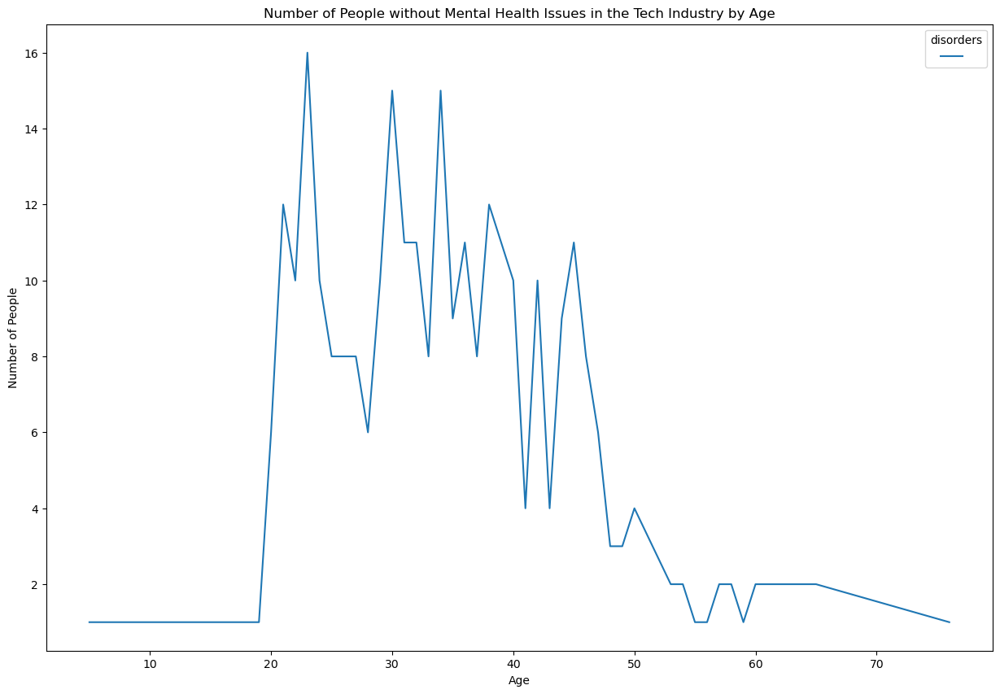

In [ ]:
# Write a bar chart that shows the number of people with mental health issues in the tech industry by age
mhs_tech_without_disorders = pd.concat([mhs_tech_without_disorders], axis=0)
mhs_tech_without_disorders['age'] = mhs_tech_without_disorders['age'].astype(int)
mhs_tech_without_disorders = mhs_tech_without_disorders.groupby(['age', 'disorders']).size().unstack(fill_value=0)
mhs_tech_without_disorders.plot(kind='line', figsize=(15, 10))
plt.title("Number of People without Mental Health Issues in the Tech Industry by Age")
plt.xlabel("Age")
plt.ylabel("Number of People")
plt.show()


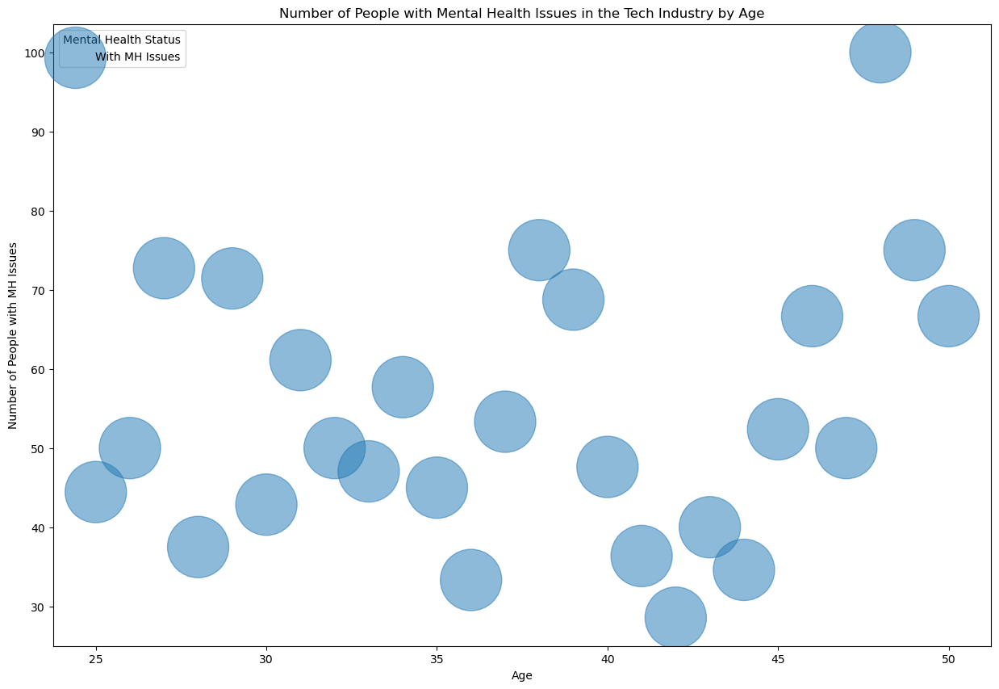

In [ ]:
# mhs_age_grouped = mhs.groupby(['age', 'has_disorders']).size().unstack(fill_value=0)

# Calculate the total count for bubble size
mhs_scatter['Total'] = mhs_scatter.sum(axis=1)
mhs_scatter = mhs_scatter.div(mhs_age.sum(axis=1), axis=0) * 100

# Plotting
plt.figure(figsize=(15, 10))
plt.scatter(mhs_scatter.index, mhs_scatter['With MH Issues'], s=mhs_scatter['Total']*10, alpha=0.5, label='With MH Issues')
# plt.scatter(mhs_scatter.index, mhs_scatter['No MH Issues'], s=mhs_scatter['Total']*10, alpha=0.5, label='No MH Issues')
plt.title("Number of People with Mental Health Issues in the Tech Industry by Age")
plt.xlabel("Age")
plt.ylabel("Number of People with MH Issues")
plt.legend(title='Mental Health Status')
plt.show()


In [ ]:
merged_mhs

,self-employed,num-employees,tech-employer,tech-role,has-mental-health-benefits,know-mental-health-options,discussed-mental-health,has-mental-health-resources,anonymity-protected,mental-health-leave-ease,comfort-discussing-health,discuss-mental-health-supervisor,discussed-mental-health-employer,discuss-mental-health-coworkers,discussed-mental-health-coworkers,coworker-mental-health-discussion,importance-physical-health,importance-mental-health,mental-health-coverage,know-mental-health-resources,reveal-mental-health-clients,effect-reveal-mental-health,reveal-mental-health-coworkers,impact-reveal-mental-health,productivity-mental-health,percentage-affected-mental-health,previous-mental-health-talk-coworkers,current-mental-health-disorder,diagnosed-mental-health,past-mental-health-disorder,sought-treatment,family-history-mental-illness,mental-health-interference-treated,mental-health-interference-untreated,observations-mental-health-discussion,share-mental-illness,physical-health-interview,mental-health-interview,open-mental-health,mental-health-career,mental-health-career-effect,team-reaction,unsupportive-response,supportive-response,industry-support,interview-mental-health,age,gender,country-live,us-state-live,race,year,submit-date,network-id,disorders
0,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,False,False,Somewhat positive,False,Somewhat negative,True,25,nan,False,False,False,True,True,Not applicable to me,True,False,5,True,True,0,False,0,5,False,True,2,False,45,Male,United States of America,Connecticut,White,2020,NaN,NaN,
1,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,True,Positive,True,Positive,True,25,nan,True,True,True,False,True,False,False,True,10,True,True,1,True,10,10,True,True,5,True,24,Female,Russia,nan,Unknown,2020,NaN,NaN,Anxiety Disorder
2,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,True,Positive,True,Positive,True,25,nan,True,True,True,False,True,False,False,True,10,True,True,1,True,10,10,True,True,5,True,24,Female,Russia,nan,Unknown,2020,NaN,NaN,
3,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,False,False,False,Negative,False,Negative,True,100,nan,True,False,False,True,True,True,True,False,5,True,False,0,False,0,0,True,True,1,True,46,Male,India,nan,Unknown,2020,NaN,NaN,
4,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,False,False,False,Negative,False,Negative,True,25,nan,True,False,False,True,True,True,True,True,1,True,False,0,False,0,6,False,False,1,True,25,Female,Canada,nan,Unknown,2020,NaN,NaN,
5,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,False,True,False,Negative,True,Somewhat negative,True,50,nan,False,False,False,True,False,False,True,True,5,True,False,0,False,0,3,True,False,3,True,25,Female,Canada,nan,Unknown,2020,NaN,NaN,
6,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,False,False,Somewhat negative,False,Neither,True,0,nan,False,False,False,False,False,False,False,True,1,True,True,1,True,1,1,True,False,1,True,5,Female,United States of America,Alabama,Asian,2020,NaN,NaN,
7,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,False,Somewhat positive,False,Not applicable to me,True,75,Mostly they have been supportive. I've also di...,True,False,True,False,True,True,True,True,9,True,False,0,False,0,5,True,False,2,True,35,Male,United States of America,Minnesota,White,2020,NaN,NaN,Anxiety Disorder
8,True,1,True,True,False,False,False,False,False,0,0,False,False,False,False,False,5,5,True,True,False,Somewhat positive,False,Not applicable to me,True,75,Mostly they have been supportive. I've also di...,True,False,True,False,True,True,True,True,9,True,False,0,False,0,5,True,False,2,True,35,Male,United States of America,Minnesota,White,2020,NaN,NaN,Mood Disorder
9,Tr

In [ ]:
merged_mhs['race'][:].to_xarray()
merged_mhs_arr=merged_mhs['race'][:].to_list()
merged_mhs_arr

['White',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Asian',
 'White',
 'White',
 'White',
 'White',
 'White',
 'Unknown',
 'Unknown',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'Unknown',
 'White',
 'White',
 'White',
 'White',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'White',
 'White',
 'White',
 'Unknown',
 'Multi',
 'Multi',
 'Multi',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'White',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Unknown',
 'Asian',
 'Asian',
 'Asian',
 'Asian',
 'Asian',
 'Asian',
 'Asian',
 'Unknown',
 'Unknown',
 'Asian',
 'Asia

In [ ]:
merged_us_tech_role_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-employer'] == 'True' & (merged_mhs['disorders'] != 'nan'))]
merged_non_us_tech_role_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-employer'] == 'True' & (merged_mhs['disorders'] != 'nan'))]

us_proportions = merged_us_tech_role_mhs.apply(lambda x: x / x.sum(), axis=1)
# international_proportions = merged_non_us_tech_role_mhs.apply(lambda x: x / x.sum(), axis=1.apply(lambda x: x / x.sum(), axis=1)

print(us_proportions)
# print(international_proportions)
# merged_us_role=[merged_us_tech_role_mhs['tech-role'].count(),merged_us_non_tech_role_mhs['tech-role'].count()]
# merged_non_us_mhs_role=[merged_non_us_tech_role_mhs['tech-role'].count(),merged_non_us_nontech_role_mhs['tech-role'].count()]



# merged_all=[merged_us_role,merged_non_us_mhs_role]
# demographics = ["United States","International"]
# X = np.arange(2)
# plt.figure(figsize=(10,7))
# tick_locations = [value for value in X]
# plt.xticks(tick_locations, ["Tech Role","Non Tech Role"],fontsize=12)
# plt.bar(X + 0.00, merged_all[0], color = 'g', width = 0.2, align="center")
# plt.bar(X + 0.20, merged_all[1], color = 'y', width = 0.2,align="center")
# plt.title("Tech Role and Non Tech Role Metrics, 2020 to 2023\n",fontsize=14)
# plt.legend(demographics, loc="best",fontsize=12)
# plt.ylabel("Total\n",fontsize=12)
# plt.xticks(rotation = 20)
# plt.ylim(0,600)
# #plt.savefig("Images/bar_change_2019")
# plt.show()


TypeError: Cannot perform 'rand_' with a dtyped [bool] array and scalar of type [bool]

In [ ]:
merged_us_tech_role_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-role'] == 'True')]
merged_us_non_tech_role_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-role'] != 'True')]

merged_non_us_tech_role_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-role'] == 'True')]
merged_non_us_nontech_role_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-role'] != 'True')]

display("US TECH ROLE CNT " + str(merged_us_tech_role_mhs['tech-role'].count()))
display("US NON TECH ROLE CNT " + str(merged_us_non_tech_role_mhs['tech-role'].count()))
display("NON US TECH ROLE CNT " + str(merged_non_us_tech_role_mhs['tech-role'].count()))
display("NON US NON TECH ROLE CNT " + str(merged_non_us_nontech_role_mhs['tech-role'].count()))
display(" The total percentge of patient(illness) in US Tech Role compared to US Non Tech Role is only " +str((merged_us_tech_role_mhs['tech-role'].count().astype('float')/(merged_us_tech_role_mhs['tech-role'].count().astype('float')+merged_us_non_tech_role_mhs['tech-role'].count().astype('float')))*100) +" %")
#us_cnt = merged_us_tech_role_mhs['tech-role'].count().astype('float')
#non_us_cnt = merged_us_non_tech_role_mhs['tech-role'].count().astype('float')

#merged_us_role=[merged_us_tech_role_mhs['tech-role'].count(),merged_us_non_tech_role_mhs['tech-role'].count()]
#display(us_cnt/(us_cnt+non_us_cnt))
#display(merged_us_role)

#print(" The total percentge of patient(illness) in Tech Employer is only " +(merged_us_tech_role_mhs['tech-role'].count().astype('float')/(merged_us_tech_role_mhs['tech-role'].count().astype('float')+merged_us_non_tech_role_mhs['tech-role'].count().astype('float'))) +"%")

'US TECH ROLE CNT 440'

'US NON TECH ROLE CNT 45'

'NON US TECH ROLE CNT 462'

'NON US NON TECH ROLE CNT 45'

' The total percentge of patient(illness) in US Tech Role compared to US Non Tech Role is only 90.72164948453609 %'

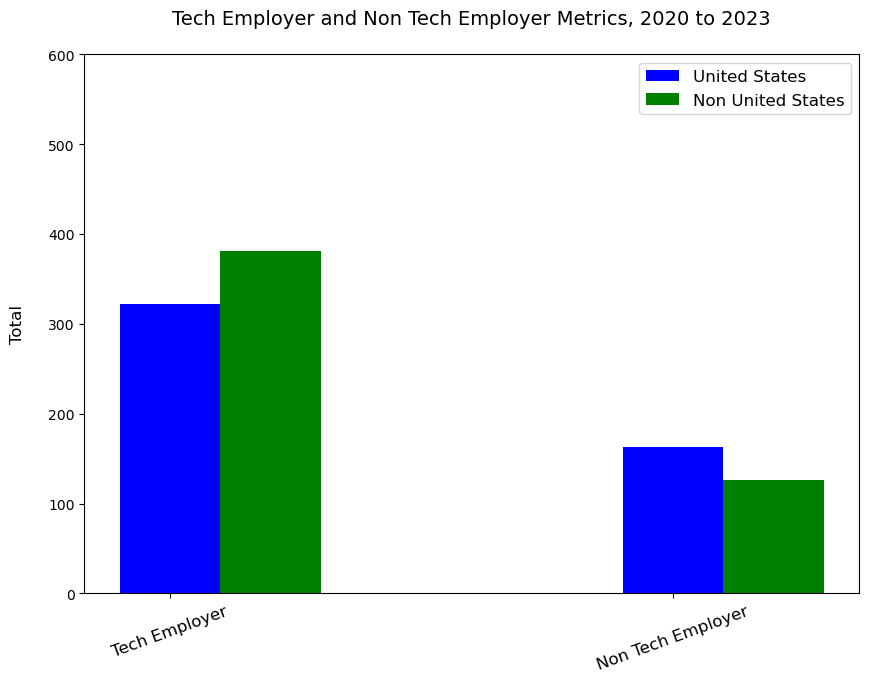

In [ ]:
merged_us_tech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-employer'] == 'True')]
merged_us_non_tech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-employer'] != 'True')]

merged_non_us_tech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-employer'] == 'True')]
merged_non_us_nontech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-employer'] != 'True')]

merged_us_arr=[merged_us_tech_employer_mhs['tech-employer'].count(),merged_us_non_tech_employer_mhs['tech-employer'].count()]
merged_non_us_mhs_arr=[merged_non_us_tech_employer_mhs['tech-employer'].count(),merged_non_us_nontech_employer_mhs['tech-employer'].count()]

merged_all=[merged_us_arr,merged_non_us_mhs_arr]
demographics = ["United States","Non United States"]
X = np.arange(2)
plt.figure(figsize=(10,7))
tick_locations = [value for value in X]
plt.xticks(tick_locations, ["Tech Employer","Non Tech Employer"],fontsize=12)
plt.bar(X + 0.00, merged_all[0], color = 'b', width = 0.2, align="center")
plt.bar(X + 0.20, merged_all[1], color = 'g', width = 0.2,align="center")
plt.title("Tech Employer and Non Tech Employer Metrics, 2020 to 2023\n",fontsize=14)
plt.legend(demographics, loc="best",fontsize=12)
plt.ylabel("Total\n",fontsize=12)
plt.xticks(rotation = 20)
plt.ylim(0,600)
#plt.savefig("Images/bar_change_2019")
plt.show()


In [ ]:
merged_us_tech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-employer'] == 'True')]
merged_us_non_tech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['tech-employer'] != 'True')]

merged_non_us_tech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-employer'] == 'True')]
merged_non_us_nontech_employer_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['tech-employer'] != 'True')]

display("US TECH EMPLOYER CNT " + str(merged_us_tech_employer_mhs['tech-employer'].count()))
display("US NON TECH EMPLOYER CNT " + str(merged_us_non_tech_employer_mhs['tech-employer'].count()))
display("NON US TECH EMPLOYER CNT " + str(merged_non_us_tech_employer_mhs['tech-employer'].count()))
display("NON US NON TECH EMPLOYER CNT " + str(merged_non_us_nontech_employer_mhs['tech-employer'].count()))
display(" The total percentge of patient(illness) in US Tech Employer compared to US Non Tech Employer is only " +str((merged_us_tech_employer_mhs['tech-employer'].count().astype('float')/(merged_us_tech_employer_mhs['tech-employer'].count().astype('float')+merged_us_non_tech_employer_mhs['tech-employer'].count().astype('float')))*100) +" %")


'US TECH EMPLOYER CNT 322'

'US NON TECH EMPLOYER CNT 163'

'NON US TECH EMPLOYER CNT 381'

'NON US NON TECH EMPLOYER CNT 126'

' The total percentge of patient(illness) in US Tech Employer compared to US Non Tech Employer is only 66.39175257731958 %'

In [ ]:
merged_us_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_us_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_us_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]

merged_uk_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United Kingdom') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_uk_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United Kingdom') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_uk_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United Kingdom') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]

merged_jp_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'Japan') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_jp_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'Japan') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_jp_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'Japan') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]

merged_us_mhs_arr=[merged_us_anxiety_mhs.size,merged_us_mood_mhs.size,merged_us_stress_mhs.size]


merged_uk_mhs_arr=[merged_uk_anxiety_mhs.size,merged_uk_mood_mhs.size,merged_uk_stress_mhs.size]


merged_jp_mhs_arr=[merged_jp_anxiety_mhs.size,merged_jp_mood_mhs.size,merged_jp_stress_mhs.size]

merged_all=[merged_us_mhs_arr,merged_uk_mhs_arr,merged_jp_mhs_arr]
merged_all

[[4565, 4620, 495], [440, 495, 0], [0, 0, 0]]

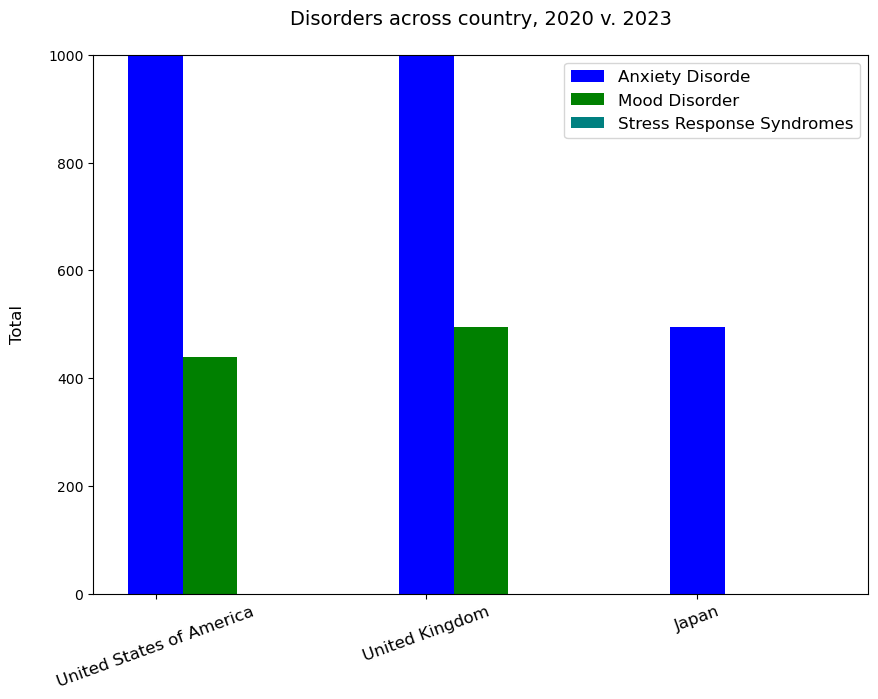

In [ ]:
job_level = ["United States of America","United Kingdom","Japan"]
demographics = ["Anxiety Disorde","Mood Disorder","Stress Response Syndromes"]
# women_change2019 = [-0.4, 4.7, 8.2, 0.0]
# af_am_change2019 = [13.9, 21.9, 46.4, 14.1]
# asian_change2019 = [35.4, 38.6, 81.3, 42.9]
# latinx_change2019 = [23.1, 40.8, 29.2, 39.4]
data =[[-0.4, 4.7, 8.2, 0.0],[13.9, 21.9, 46.4, 14.1],[35.4, 38.6, 81.3, 42.9],[23.1, 40.8, 29.2, 39.4]]

X = np.arange(3)
plt.figure(figsize=(10,7))
tick_locations = [value for value in X]
plt.xticks(tick_locations, ["United States of America","United Kingdom","Japan"],fontsize=12)
plt.bar(X + 0.00, merged_all[0], color = 'b', width = 0.2, align="center")
plt.bar(X + 0.20, merged_all[1], color = 'g', width = 0.2,align="center")
plt.bar(X + 0.40, merged_all[2], color = 'teal', width = 0.2,align="center")
plt.title("Disorders across country, 2020 v. 2023\n",fontsize=14)
plt.legend(demographics, loc="best",fontsize=12)
plt.ylabel("Total\n",fontsize=12)
plt.xticks(rotation = 20)
plt.ylim(0,1000)
#plt.savefig("Images/bar_change_2019")
plt.show()


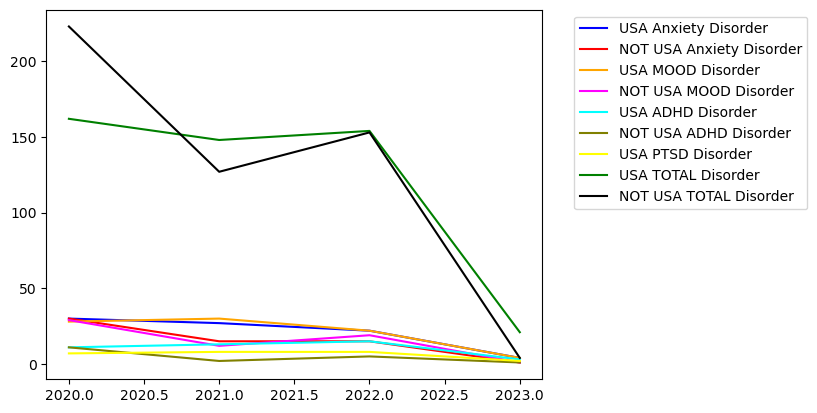

In [ ]:
merged_us_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_us_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_us_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]
merged_us_adhd_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'ADHD')]
merged_us_ptsd_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'PTSD')]
merged_us_ocd_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'OCD')]
merged_us_common_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') ]

merged_not_us_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_not_us_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_not_us_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]
merged_not_us_adhd_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['disorders'] == 'ADHD')]
merged_not_us_ptsd_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['disorders'] == 'PTSD')]
merged_not_us_ocd_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') & (merged_mhs['disorders'] == 'OCD')]
merged_not_us_common_mhs=merged_mhs.loc[(merged_mhs['country-live'] != 'United States of America') ]

#merged_jp_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'India') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
#merged_jp_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'India') & (merged_mhs['disorders'] == 'Mood Disorder')]
#merged_jp_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'India') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]
#merged_us_mhs_arr=[merged_us_anxiety_mhs.size,merged_us_mood_mhs.size,merged_us_stress_mhs.size]
#merged_uk_mhs_arr=[merged_uk_anxiety_mhs.size,merged_uk_mood_mhs.size,merged_uk_stress_mhs.size]
#merged_jp_mhs_arr=[merged_jp_anxiety_mhs.size,merged_jp_mood_mhs.size,merged_jp_stress_mhs.size]



#us_anxiety_unemployment = merged_us_anxiety_mhs[[str(year) for year in range(2020, 2023)]].mean()

# Collect the years where data was collected
years =  np.array([2020,2021,2022,2023])
grouped_usa_anxiety = merged_us_anxiety_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_anxiety = merged_not_us_anxiety_mhs.groupby("year")[['country-live']].count()

grouped_usa_mood = merged_us_mood_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_mood = merged_not_us_mood_mhs.groupby("year")[['country-live']].count()

grouped_usa_stress = merged_us_stress_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_stress = merged_not_us_stress_mhs.groupby("year")[['country-live']].count()

grouped_usa_adhd = merged_us_adhd_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_adhd = merged_not_us_adhd_mhs.groupby("year")[['country-live']].count()

grouped_usa_ptsd = merged_us_ptsd_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_ptsd = merged_not_us_ptsd_mhs.groupby("year")[['country-live']].count()

grouped_usa_ocd = merged_us_ocd_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_ocd = merged_not_us_ocd_mhs.groupby("year")[['country-live']].count()

grouped_usa_common = merged_us_common_mhs.groupby("year")[['country-live']].count()
grouped_not_usa_common = merged_not_us_common_mhs.groupby("year")[['country-live']].count()


#grouped_jp_anxiety = merged_jp_anxiety_mhs.groupby("year")[['country-live']].count()

usa_avg_anx, = plt.plot(years, grouped_usa_anxiety, color="blue", label="USA Anxiety Disorder" )
not_usa_avg_anx, = plt.plot(years, grouped_not_usa_anxiety, color="red", label="NOT USA Anxiety Disorder" )

usa_avg_mood, = plt.plot(years, grouped_usa_mood, color="orange", label="USA MOOD Disorder" )
not_usa_avg_mood, = plt.plot(years, grouped_not_usa_mood, color="magenta", label="NOT USA MOOD Disorder" )

#usa_avg_stress, = plt.plot(years, grouped_usa_stress, color="blue", label="USA Stress Disorder" )
#not_usa_avg_stress, = plt.plot(years, grouped_not_usa_stress, color="red", label="NOT USA Stress Disorder" )

usa_avg_adhd, = plt.plot(years, grouped_usa_adhd, color="cyan", label="USA ADHD Disorder" )
not_usa_avg_adhd, = plt.plot(years, grouped_not_usa_adhd, color="olive", label="NOT USA ADHD Disorder" )

usa_avg_ptsd, = plt.plot(years, grouped_usa_ptsd, color="yellow", label="USA PTSD Disorder" )
#not_usa_avg_ptsd, = plt.plot(years, grouped_not_usa_ptsd, color="red", label="NOT USA PTSD Disorder" )

#usa_avg_ocd, = plt.plot(years, grouped_usa_ocd, color="blue", label="USA OCD Disorder" )
#not_usa_avg_ocd, = plt.plot(years, grouped_not_usa_ocd, color="red", label="NOT USA OCD Disorder" )

usa_avg_cmn, = plt.plot(years, grouped_usa_common, color="green", label="USA TOTAL Disorder" )
not_usa_avg_cmn, = plt.plot(years, grouped_not_usa_common, color="black", label="NOT USA TOTAL Disorder" )

#jp_avg, = plt.plot(years, grouped_jp_anxiety, color="green", label="INDIA Anxiety Disorder" )

# Plot the unemployment values for a single country
#country_one, = plt.plot(years, combined_unemployed_data.loc['USA',["2010","2011","2012","2013","2014","2015",
#                                                                  "2016","2017","2018","2019","2020"]], 
#                        color="green",label=combined_unemployed_data.loc['USA',"Country Name"])

# Create a legend for our chart
plt.legend(handles=[usa_avg_anx,not_usa_avg_anx,usa_avg_mood,not_usa_avg_mood,usa_avg_adhd,not_usa_avg_adhd
                   ,usa_avg_ptsd,usa_avg_cmn,not_usa_avg_cmn],loc='upper left', bbox_to_anchor=(1.05,1))
# Show the chart
plt.show()



T

In [ ]:
mental_health_file= "resources/Mental_Health_Care_in_the_Last_4_Weeks.csv"


# Read the mouse data and the study results
mental_health_df = pd.read_csv(mental_health_file)

In [ ]:
mental_health_df

,Indicator,Group,State,Subgroup,Phase,Time Period,Time Period Label,Time Period Start Date,Time Period End Date,Value,LowCI,HighCI,Confidence Interval,Quartile Range,Suppression Flag
0,Took Prescription Medication for Mental Health...,National Estimate,United States,United States,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,19.4,19.0,19.8,19.0 - 19.8,NaN,NaN
1,Took Prescription Medication for Mental Health...,By Age,United States,18 - 29 years,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,18.7,17.2,20.3,17.2 - 20.3,NaN,NaN
2,Took Prescription Medication for Mental Health...,By Age,United States,30 - 39 years,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,18.3,17.3,19.2,17.3 - 19.2,NaN,NaN
3,Took Prescription Medication for Mental Health...,By Age,United States,40 - 49 years,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,20.4,19.5,21.3,19.5 - 21.3,NaN,NaN
4,Took Prescription Medication for Mental Health...,By Age,United States,50 - 59 years,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,21.2,20.2,22.2,20.2 - 22.2,NaN,NaN
5,Took Prescription Medication for Mental Health...,By Age,United States,60 - 69 years,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,19.7,18.7,20.7,18.7 - 20.7,NaN,NaN
6,Took Prescription Medication for Mental Health...,By Age,United States,70 - 79 years,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,18.4,17.0,19.9,17.0 - 19.9,NaN,NaN
7,Took Prescription Medication for Mental Health...,By Age,United States,80 years and above,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,13.8,11.0,17.0,11.0 - 17.0,NaN,NaN
8,Took Prescription Medication for Mental Health...,By Sex,United States,Male,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,13.7,13.0,14.3,13.0 - 14.3,NaN,NaN
9,Took Prescription Medication for Mental Health...,By Sex,United States,Female,2,13,"Aug 19 - Aug 31, 2020",08/19/2020,08/31/2020,24.6,24.0,25.2,24.0 - 25.2,NaN,NaN


In [ ]:
mental_health_df['year']=pd.DatetimeIndex(mental_health_df['Time Period Start Date']).year

In [ ]:
mental_health_df.value_counts("Indicator")

Indicator
Needed Counseling or Therapy But Did Not Get It, Last 4 Weeks                                         2601
Received Counseling or Therapy, Last 4 Weeks                                                          2601
Took Prescription Medication for Mental Health And/Or Received Counseling or Therapy, Last 4 Weeks    2601
Took Prescription Medication for Mental Health, Last 4 Weeks                                          2601
Name: count, dtype: int64

In [ ]:
mental_health_df.value_counts("State")

State
United States           3672
Alabama                  132
Pennsylvania             132
Nevada                   132
New Hampshire            132
New Jersey               132
New Mexico               132
New York                 132
North Carolina           132
North Dakota             132
Ohio                     132
Oklahoma                 132
Oregon                   132
Rhode Island             132
Alaska                   132
South Carolina           132
South Dakota             132
Tennessee                132
Texas                    132
Utah                     132
Vermont                  132
Virginia                 132
Washington               132
West Virginia            132
Wisconsin                132
Nebraska                 132
Montana                  132
Missouri                 132
Idaho                    132
Arizona                  132
Arkansas                 132
California               132
Colorado                 132
Connecticut              132
Delaware

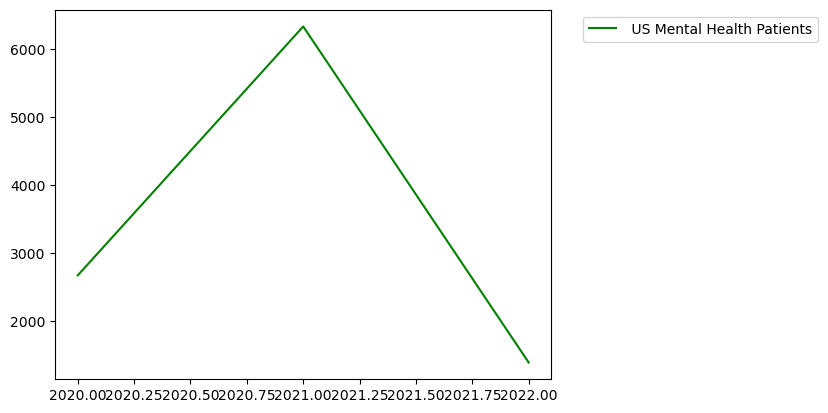

In [ ]:
years =  np.array([2020,2021,2022])
mental_us_health_df=mental_health_df.loc[(mental_health_df['State'] == 'United States')]
mental_us_health_year_data = mental_health_df.groupby("year")[['State']].count()

not_usa_avg_cmn, = plt.plot(years, mental_us_health_year_data, color="Green", label=" US Mental Health Patients" )

plt.legend(handles=[not_usa_avg_cmn],loc='upper left', bbox_to_anchor=(1.05,1))
# Show the chart
plt.show()




In [ ]:
mental_us_health_year_data

,State
year,
2020,2676
2021,6332
2022,1396


In [ ]:
healthgov_data_file= "resources/Places_local_data.csv"


# Read the mouse data and the study results
healthgov_data_file_df = pd.read_csv(healthgov_data_file)

In [ ]:
healthgov_data_file_df.value_counts("Year")

Year
2021    178466
2020     50304
Name: count, dtype: int64

In [ ]:
healthgov_data_file_df.head()

,Year,StateAbbr,StateDesc,LocationName,DataSource,Category,Measure,Data_Value_Unit,Data_Value_Type,Data_Value,Data_Value_Footnote_Symbol,Data_Value_Footnote,Low_Confidence_Limit,High_Confidence_Limit,TotalPopulation,LocationID,CategoryID,MeasureId,DataValueTypeID,Short_Question_Text,Geolocation
0,2021,AR,Arkansas,Conway,BRFSS,Health Outcomes,Arthritis among adults aged >=18 years,%,Crude prevalence,33.9,NaN,NaN,29.1,38.8,20873,5029,HLTHOUT,ARTHRITIS,CrdPrv,Arthritis,POINT (-92.6892479 35.265702)
1,2020,AZ,Arizona,Maricopa,BRFSS,Prevention,Mammography use among women aged 50-74 years,%,Crude prevalence,69.0,NaN,NaN,65.5,72.3,4496588,4013,PREVENT,MAMMOUSE,CrdPrv,Mammography,POINT (-112.4989296 33.3451756)
2,2021,AR,Arkansas,Jackson,BRFSS,Health Outcomes,Obesity among adults aged >=18 years,%,Crude prevalence,40.1,NaN,NaN,32.5,47.8,16811,5067,HLTHOUT,OBESITY,CrdPrv,Obesity,POINT (-91.2232051 35.5964674)
3,2020,CA,California,Alameda,BRFSS,Health Outcomes,All teeth lost among adults aged >=65 years,%,Crude prevalence,6.7,NaN,NaN,4.8,9.2,1648556,6001,HLTHOUT,TEETHLOST,CrdPrv,All Teeth Lost,POINT (-121.912488 37.6471385)
4,2021,AR,Arkansas,Ashley,BRFSS,Health Outcomes,Depression among adults aged >=18 years,%,Crude prevalence,25.4,NaN,NaN,21.3,30.0,18674,5003,HLTHOUT,DEPRESSION,CrdPrv,Depression,POINT (-91.7722672 33.1908354)


In [ ]:
job_level = healthgov_data_file_df["StateDesc"].drop_duplicates().to_list()

job_level

['Arkansas',
 'Arizona',
 'California',
 'United States',
 'Alaska',
 'Alabama',
 'Colorado',
 'Georgia',
 'Connecticut',
 'Florida',
 'Illinois',
 'Hawaii',
 'Idaho',
 'Indiana',
 'Iowa',
 'Kansas',
 'Maine',
 'Kentucky',
 'Michigan',
 'Louisiana',
 'Maryland',
 'Minnesota',
 'Mississippi',
 'Missouri',
 'Montana',
 'Nebraska',
 'North Carolina',
 'New York',
 'New Mexico',
 'New Jersey',
 'Nevada',
 'New Hampshire',
 'Ohio',
 'Oklahoma',
 'North Dakota',
 'Oregon',
 'South Dakota',
 'Tennessee',
 'Pennsylvania',
 'South Carolina',
 'Texas',
 'Virginia',
 'Utah',
 'Wisconsin',
 'West Virginia',
 'Wyoming',
 'Washington',
 'Delaware',
 'District of Columbia',
 'Massachusetts',
 'Vermont',
 'Rhode Island']

ValueError: x and y must have same first dimension, but have shapes (2,) and (0, 1)

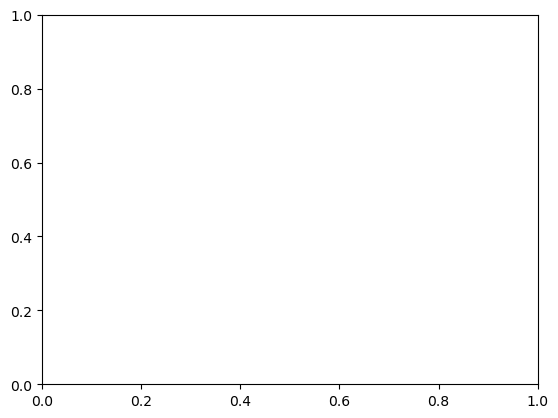

In [ ]:
#mental health not good for >=14 days among adults aged >=18 years
years =  np.array([2020,2021])
#mental_healthgov_data_file_df=healthgov_data_file_df.loc[(healthgov_data_file_df['StateDesc'] == 'New York')  & (healthgov_data_file_df['Measure'] == 'mental health not good for >=14 days among adults aged >=18 years')]
mental_healthgov_data_file_df=healthgov_data_file_df.loc[(healthgov_data_file_df['Year'] == 2020)  & (healthgov_data_file_df['Measure'] == 'Mental health not good for >=14 days among adults aged >=18 years')]
#mental_healthgov_data_file_df=healthgov_data_file_df.loc[(healthgov_data_file_df['StateDesc'] == 'New York')  ]

mental_healthgov_us_health_year_data = mental_healthgov_data_file_df.groupby("Year")[['StateDesc']].count()
#mental_healthgov_data_file_df
not_usa_hlth_cmn, = plt.plot(years, mental_healthgov_us_health_year_data, color="Green", label=" US Mental Health Patients" )

#plt.legend(handles=[not_usa_hlth_cmn],loc='upper left', bbox_to_anchor=(1.05,1))
# Show the chart
plt.show()


merged_us_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_us_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_us_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United States of America') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]

merged_uk_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United Kingdom') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_uk_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United Kingdom') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_uk_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'United Kingdom') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]

merged_jp_anxiety_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'Japan') & (merged_mhs['disorders'] == 'Anxiety Disorder')]
merged_jp_mood_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'Japan') & (merged_mhs['disorders'] == 'Mood Disorder')]
merged_jp_stress_mhs=merged_mhs.loc[(merged_mhs['country-live'] == 'Japan') & (merged_mhs['disorders'] == 'Stress Response Syndromes')]

merged_us_mhs_arr=[merged_us_anxiety_mhs.size,merged_us_mood_mhs.size,merged_us_stress_mhs.size]


merged_uk_mhs_arr=[merged_uk_anxiety_mhs.size,merged_uk_mood_mhs.size,merged_uk_stress_mhs.size]


merged_jp_mhs_arr=[merged_jp_anxiety_mhs.size,merged_jp_mood_mhs.size,merged_jp_stress_mhs.size]

merged_all=[merged_us_mhs_arr,merged_uk_mhs_arr,merged_jp_mhs_arr]
merged_all


#job_level = ["United States of America","United Kingdom","Japan"]
job_level = healthgov_data_file_df["StateDesc"].drop_duplicates().to_list()

demographics = ["Anxiety Disorde","Mood Disorder","Stress Response Syndromes"]
# women_change2019 = [-0.4, 4.7, 8.2, 0.0]
# af_am_change2019 = [13.9, 21.9, 46.4, 14.1]
# asian_change2019 = [35.4, 38.6, 81.3, 42.9]
# latinx_change2019 = [23.1, 40.8, 29.2, 39.4]
data =[[-0.4, 4.7, 8.2, 0.0],[13.9, 21.9, 46.4, 14.1],[35.4, 38.6, 81.3, 42.9],[23.1, 40.8, 29.2, 39.4]]

X = np.arange(52)
plt.figure(figsize=(10,7))
tick_locations = [value for value in X]
plt.xticks(tick_locations, job_level,fontsize=12)
mental_healthgov_data_file_df=healthgov_data_file_df.loc[(healthgov_data_file_df['Year'] == 2020)  & (healthgov_data_file_df['Measure'] == 'Mental health not good for >=14 days among adults aged >=18 years')]

merged_us_mhs_arr=[merged_us_anxiety_mhs.size,merged_us_mood_mhs.size,merged_us_stress_mhs.size]

mental_healthgov_us_health_year_data = mental_healthgov_data_file_df.groupby("Year")[['StateDesc']].count()

plt.bar(X + 0.00, merged_all[0], color = 'b', width = 0.2, align="center")
plt.bar(X + 0.20, merged_all[1], color = 'g', width = 0.2,align="center")
plt.bar(X + 0.40, merged_all[2], color = 'teal', width = 0.2,align="center")
plt.title("Disorders across country, 2020 v. 2023\n",fontsize=14)
plt.legend(demographics, loc="best",fontsize=12)
plt.ylabel("Total\n",fontsize=12)
plt.xticks(rotation = 20)
plt.ylim(0,1000)
#plt.savefig("Images/bar_change_2019")
plt.show()
